# **Chapter 1. PyTorch Workflow**

Let's explore an example of PyTorch end-to-end workflow.

Resources:
* Ground truth notebook - https://github.com/mrdbourke/pytorch-deep-learning/discussions
* Book version - https://www.learnpytorch.io/01_pytorch_workflow/

In [ ]:
what_were_covering = {1: "data (prepare and load)",
                      2: "build model",
                      3: "fitting the model to data (training)",
                      4: "making predictions and evaluating a model (inference)",
                      5: "saving and loading a model",
                      6: "putting it all together"}
what_were_covering

{1: 'data (prepare and load)',
 2: 'build model',
 3: 'fitting the model to data (training)',
 4: 'making predictions and evaluating a model (inference)',
 5: 'saving and loading a model',
 6: 'putting it all together'}

In [ ]:
pip install torch

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21

In [ ]:
import torch
from torch import nn # nn contains all of PyTorch's building blocks for neural networks.
import matplotlib.pyplot as plt
print(torch.__version__)

2.3.0+cu121


# 1. **Data (preparing and loading)**

Data can be almost anything ... in machine learning:
* Excel spreadsheet
* Images of any kind
* Videos (Youtube has a lot of data)
* Audio like songs or podcasts
* DNA
* Text

Machine learning is a game of two parts:
1. Get data into a numerical representation.
2. Build a model to learn patterns in that numerical representation.

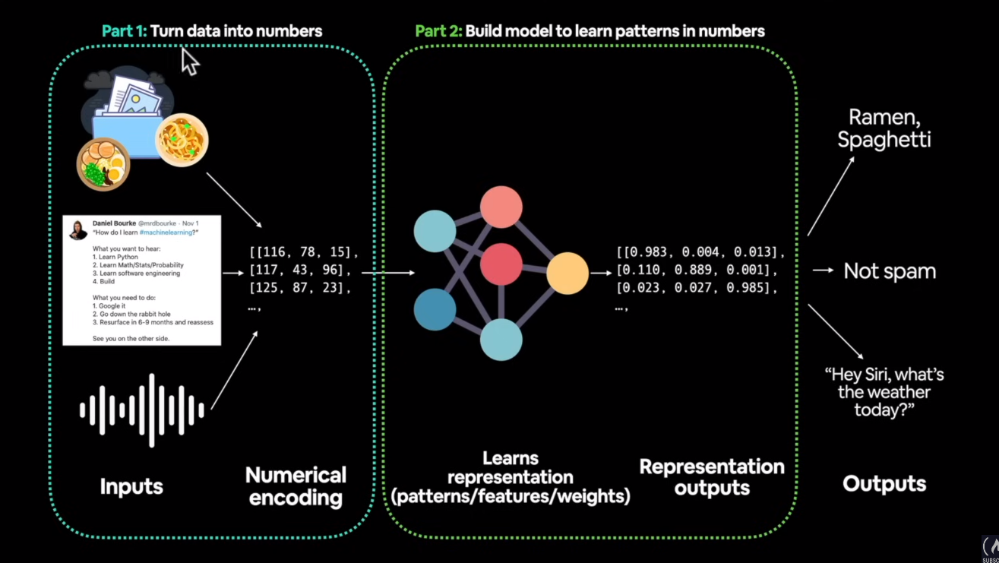

# 2. **To showcase this, let's create some *known* data using the linear regression formula.**

We'll use a linear regression formula to make a straight line with *known* **PARAMETERS**. A **PARAMETER** is something that a model learns.

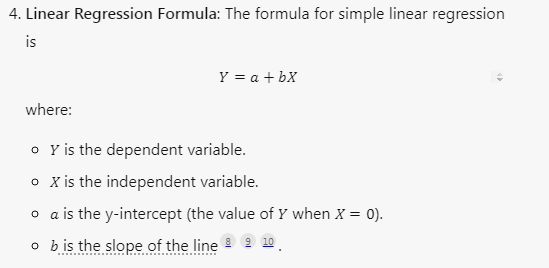

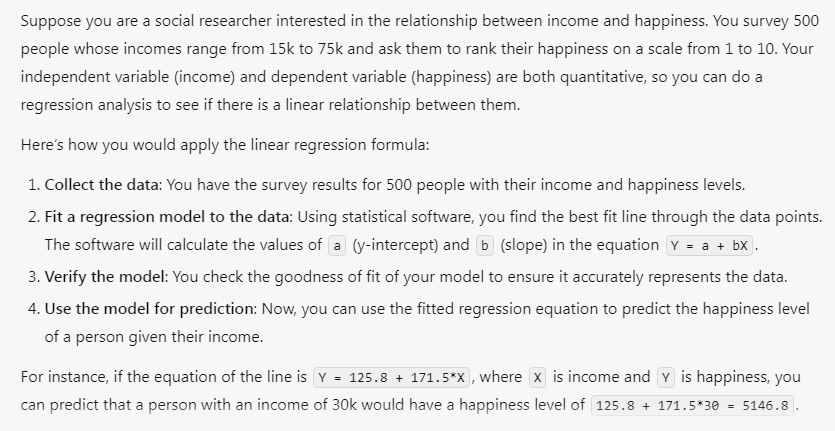

**WEIGHTS and BIAS**

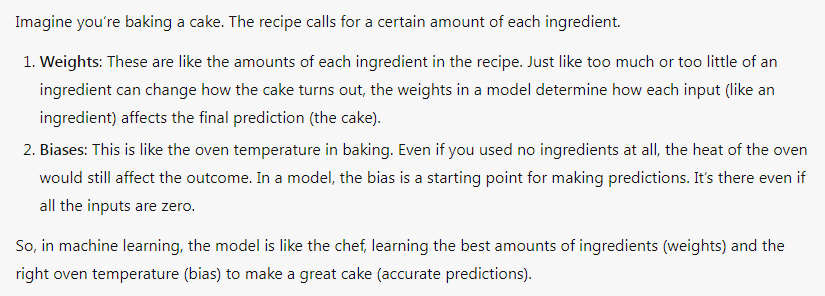

In [ ]:
# Create *known* parameters

weight = 0.7
bias = 0.3

# Create a data to build a model
import torch

start = 0
end = 1
step = 0.02
X = torch.arange(start, end, step).unsqueeze(dim=1)  # X is a capital letter because in ML and DL it is a MATRIX (2D) or a TENSOR (3D)
y = weight * X + bias  # y is a lowercase which represents a VECTOR (1D)

X[:10], y[:10]



(tensor([[0.0000],
         [0.0200],
         [0.0400],
         [0.0600],
         [0.0800],
         [0.1000],
         [0.1200],
         [0.1400],
         [0.1600],
         [0.1800]]),
 tensor([[0.3000],
         [0.3140],
         [0.3280],
         [0.3420],
         [0.3560],
         [0.3700],
         [0.3840],
         [0.3980],
         [0.4120],
         [0.4260]]))

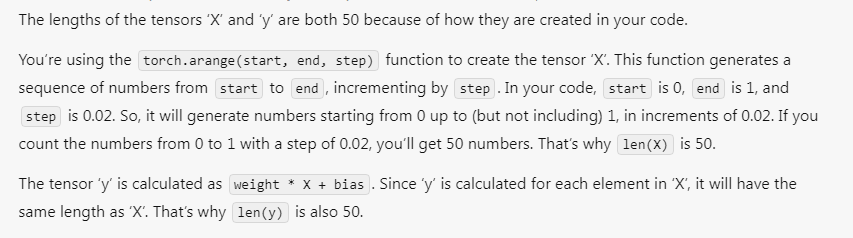

In [ ]:
len(X), len(y)

(50, 50)

In Python, `X[:10]` and `y[:10]` are examples of slicing. Here's what they mean:

- `X[:10]`: This is slicing the tensor 'X'. The `:` operator is used to specify a range in the tensor. When used without a starting index (as in `:10`), it means "start from the beginning". So, `X[:10]` means "give me the first 10 elements of 'X'".

- `y[:10]`: Similarly, this is slicing the tensor 'y' to get its first 10 elements.

The number `10` here specifies the number of elements you want from the start of the tensor. You can replace it with any number `n` to get the first `n` elements.

The semicolon (`;`) is not present in the code you provided. If you see a semicolon in Python code, it's usually used to separate multiple statements on a single line. For example, `a = 5; b = 6` is equivalent to:
```python
a = 5
b = 6
```
I hope this helps! If you have any more questions, feel free to ask. 😊

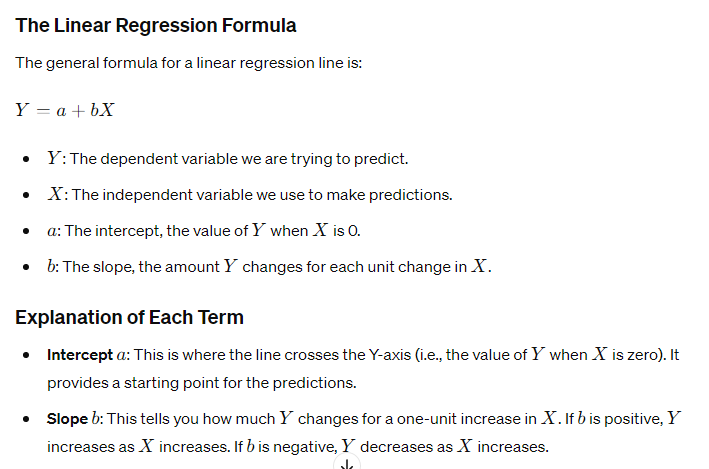

Alright, let's break it down even more simply, step by step, just like explaining it to a 7-year-old.

### The Equation
First, let's start with the equation we have:

\[ Y = 0.3 + 0.7X \]

- **0.3** is where we start (the intercept).
- **0.7** is how much we add for each step of \( X \) (the slope).

### Step-by-Step Explanation

Imagine you are standing on a number line, and every time you take a step to the right (increasing \( X \)), you go up a hill that gets steeper. The hill's steepness is the slope.

#### Point at \( X = 0 \)
When \( X \) is 0, you're just starting.

- The equation says \( Y = 0.3 + 0.7 \times 0 \).
- Since 0 times anything is 0, we just have \( Y = 0.3 \).
- So, at \( X = 0 \), \( Y = 0.3 \).

#### Point at \( X = 1 \)
Now, take one step to the right to \( X = 1 \).

- The equation now is \( Y = 0.3 + 0.7 \times 1 \).
- First, calculate \( 0.7 \times 1 \). That's easy: \( 0.7 \).
- Now add the starting point: \( 0.3 + 0.7 = 1.0 \).
- So, at \( X = 1 \), \( Y = 1.0 \).

#### Point at \( X = 2 \)
Take another step to the right to \( X = 2 \).

- The equation now is \( Y = 0.3 + 0.7 \times 2 \).
- First, calculate \( 0.7 \times 2 \). That’s \( 1.4 \).
- Now add the starting point: \( 0.3 + 1.4 = 1.7 \).
- So, at \( X = 2 \), \( Y = 1.7 \).

### Visualizing on a Graph

Let’s plot these points on a simple graph.

```
Y-axis
  2 |           *
    |           
  1 |      *
    |
0.3 | *  
    +---------------- X-axis
      0    1    2
```

- **(0, 0.3)**: When \( X \) is 0, \( Y \) is 0.3. This is our starting point.
- **(1, 1.0)**: When \( X \) is 1, \( Y \) is 1.0. Take one step to the right, you go up to 1.0.
- **(2, 1.7)**: When \( X \) is 2, \( Y \) is 1.7. Take two steps to the right, you go up to 1.7.

### Summary

1. **Intercept (0.3)**: This is where we start on the Y-axis. It's the value of \( Y \) when \( X \) is 0.
2. **Slope (0.7)**: For each step to the right on \( X \), we go up by 0.7 on \( Y \).

So, you can see how the line starts at 0.3 when \( X \) is 0 and then goes up by 0.7 for each step to the right on the \( X \)-axis.

# 3. **Splitting our data into training and test sets (probably the most important concepts in Machine Learning)**



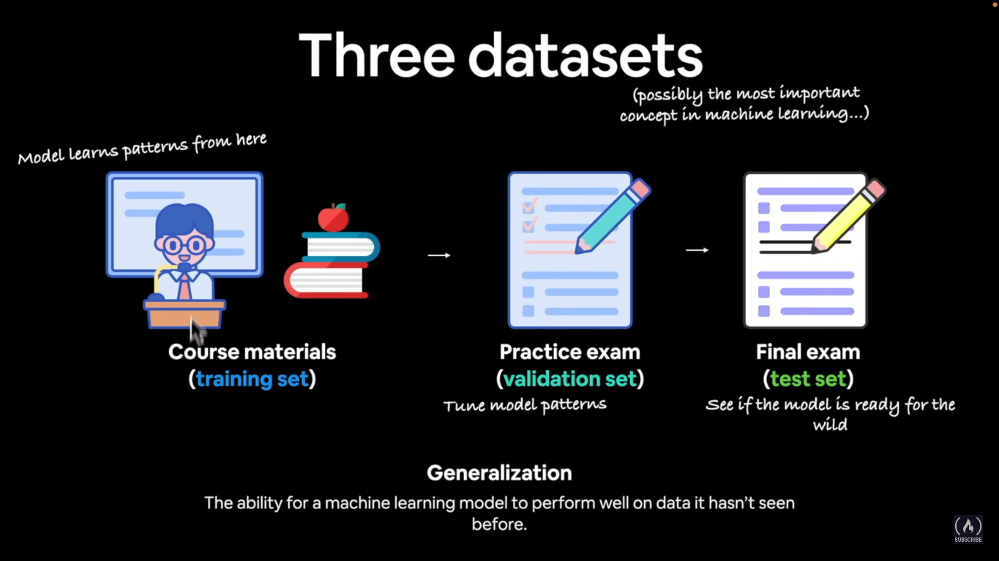

In [ ]:
# Create a train and test split

train_split = int(0.8 * len(X))
X_train, y_train = X[: train_split], y[: train_split]
X_test, y_test = X[train_split: ], y[train_split: ]

len(X_train), len(y_train), len(X_test), len(y_test)

(40, 40, 10, 10)

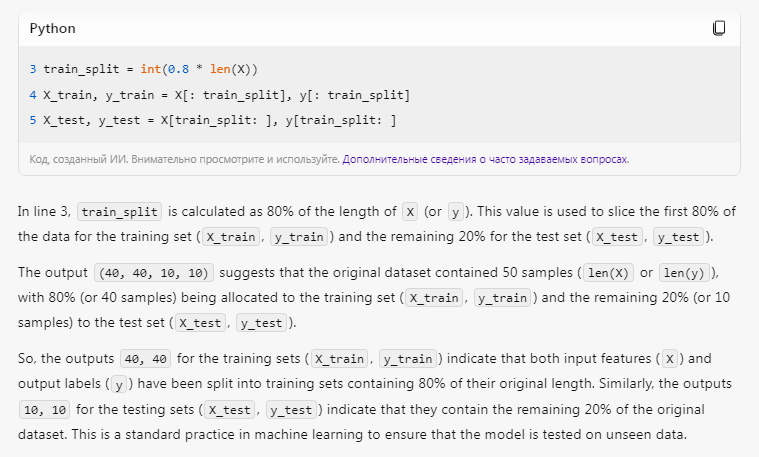

# 4. **Building a function to visualize our data.**

How might we better visualize our data?

This is where the data explorer's motto comes in!
"Visualize, visualize, visualize"

In [ ]:
import matplotlib.pyplot as plt

def plot_predictions(train_data=X_train,
                     train_labels=y_train,
                     test_data=X_test,
                     test_labels=y_test,
                     predictions=None):
  """
  Plots training data, test data and compares predictions.
  """
  plt.figure(figsize=(10, 7))

  # Plot training data in blue

  plt.scatter(train_data, train_labels, c='b', s=4, label= "Training data")

  # Plot test data in green

  plt.scatter(test_data, test_labels, c='g', s=4, label= "Testing data")

  # Are there predictions?
  if predictions is not None:

    # Plot the predictions if they exist
    plt.scatter(test_data, predictions, c='r', s=4, label= "Predictions")

    # Show the legend
    plt.legend(prop={'size': 14});

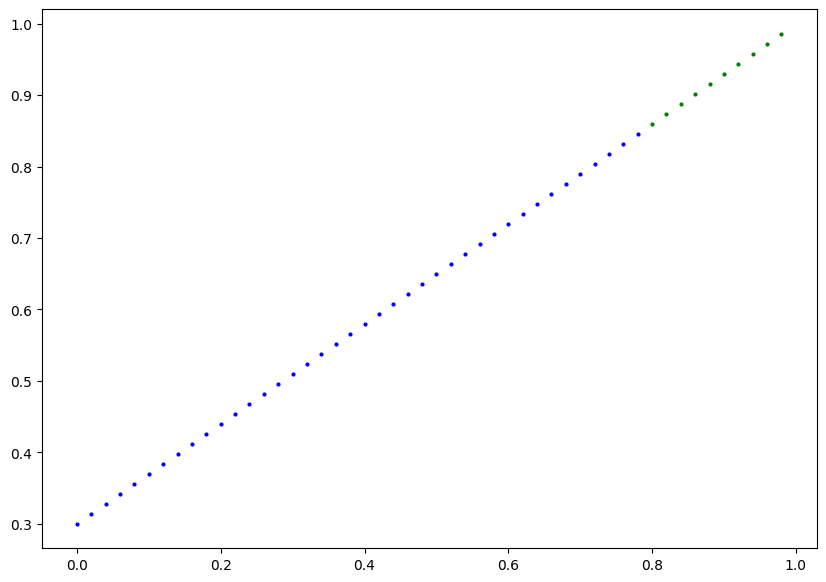

In [ ]:
 plot_predictions();

# 5. **Creating our first PyTorch model for linear regression.**

Our first PyTorch model.

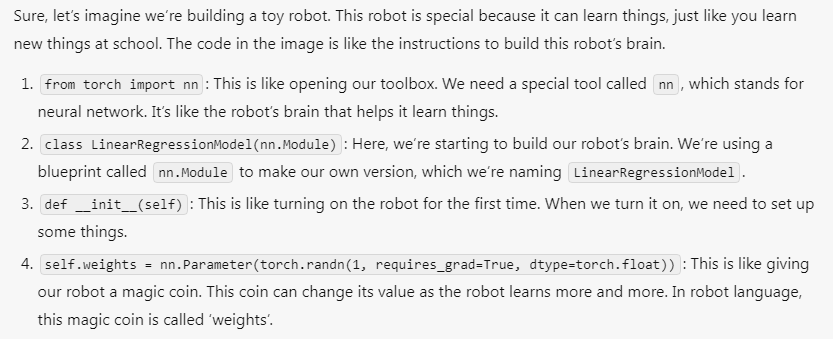

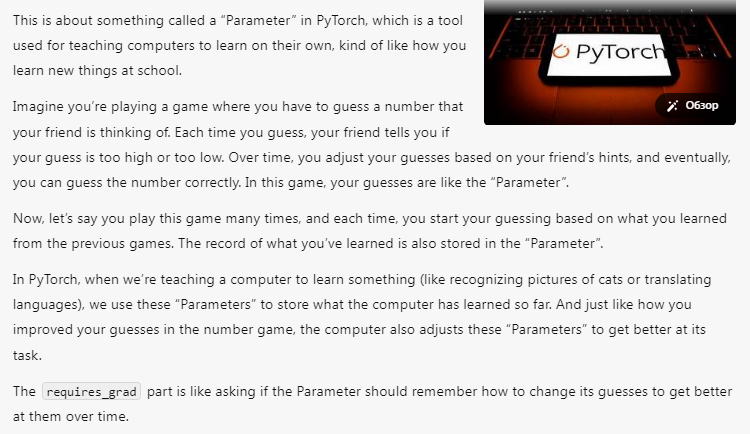

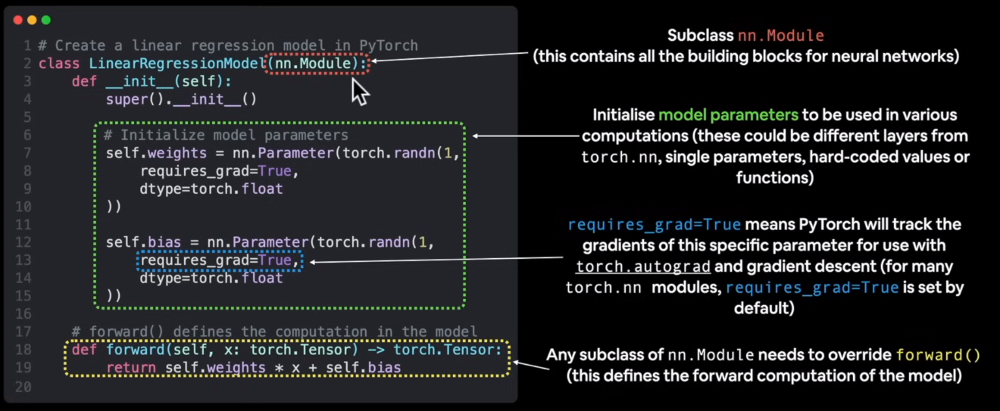

### **WHAT OUR MODEL DOES**:

* Start with random values (weight & bias)
* Look at training data and adjust the random values to better represent (or get closer to) the ideal values (the weight & bias values we used to create the data)

**HOW DOES IT DO SO?**
Through two algorithms:

1. Gradient descent
2. Backpropagation

In [ ]:
from torch import nn # nn = neural network

# Create a linear regression model class.

class LinearRegressionModel(nn.Module):
   def __init__(self):
    super().__init__()
    self.weights = nn.Parameter(torch.randn(1, # Almost anything in PyTorch inherits from nn.Module.
                                            requires_grad=True, # Can this parameter be updated via gradient descent?
                                            dtype=torch.float)) # PyTorch loves the datatype torch.float32

    self.bias = nn.Parameter(torch.randn(1, # Almost anything in PyTorch inherits from nn.Module.
                                         requires_grad=True, # Can this parameter be updated via gradient descent?
                                         dtype=torch.float)) # PyTorch loves the datatype torch.float32

   # Forward method to define the computation in the model.

   def forward(self, x: torch.Tensor) -> torch.Tensor: # "x" is the input data
       return self.weights * x + self.bias # This is the linear regression formula.

1. Sure, let's imagine you're helping your mom bake a cake. She gives you a scoop and tells you that for each cup of flour, you need to add 2 scoops of sugar. This is a bit like linear regression!

In linear regression, we're trying to find the relationship between two things. In our cake example, we're looking at the relationship between flour and sugar. We could say that the amount of sugar (let's call this y) depends on the amount of flour (let's call this x).

So, if we have 1 cup of flour, we need 2 scoops of sugar. If we have 2 cups of flour, we need 4 scoops of sugar, and so on. We can write this as a simple equation: y = 2x. This is our model.

Just like in baking, in machine learning, we use linear regression to predict an outcome (y) based on some input (x). But instead of flour and sugar, we might be looking at things like hours studied and test scores, or rainfall and crop yield.

And just like your mom figured out the perfect sugar-to-flour ratio for her cake, in machine learning, we use lots of data to figure out the perfect relationship between our inputs and outputs. That's linear regression in a nutshell! 🍰

2. Sure, let's continue with our baking analogy to explain gradient descent!

Imagine you're trying to make the perfect cake, but you're not sure how much sugar and flour to use. You start with a random guess, but the cake doesn't taste quite right. You need to improve your recipe, but how do you know whether to add more sugar, less flour, or maybe change both?

This is where gradient descent comes in! It's like a magical compass that tells you which direction to change your ingredients to make the cake taste better.

Here's how it works:

1. Step 1: You start with a random recipe (this is your initial guess).
2. Step 2: You follow the compass (calculate the gradient) to see which direction will make the cake taste better. If adding more sugar makes it better, the compass points towards more sugar. If less flour is better, it points towards less flour.
3. Step 3: You take a small step in the direction the compass points (this is the descent part). You don't want to change the recipe too much at once, just a little bit at a time.
4. Step 4: You repeat steps 2 and 3 until the compass says you're at the best recipe (this is when you've reached the minimum of the function).

In machine learning, we use gradient descent to tweak our model (the recipe) little by little, so that our predictions (the taste of the cake) get better and better! 🧭🎂

3. Sure, let's continue with our cake baking analogy to explain backpropagation!

Imagine you're trying to bake the perfect cake, but this time, the recipe is a bit more complicated. You have many ingredients like flour, sugar, eggs, butter, and baking powder, and each ingredient affects the taste of the cake in a different way.

Now, suppose you've baked a cake, but it didn't turn out as you expected. It's too sweet! You know you need to change something, but what? Should you use less sugar? Or maybe less butter? Or perhaps you need more flour?

This is where backpropagation comes in. It's like a super compass that not only tells you how to change each ingredient to make the cake better, but also how much each ingredient contributed to the mistake (the too-sweet cake).

Here's how it works:

1. Step 1: You start with a random recipe (this is your initial guess).
2. Step 2: You bake a cake and taste it (this is the forward pass in neural networks).
3. Step 3: You realize the cake is too sweet (this is calculating the error).
4. Step 4: You use the super compass (backpropagation) to figure out how much each ingredient contributed to the mistake. Maybe the sugar made it 70% too sweet, the butter 20%, and the flour 10%.
5. Step 5: You change each ingredient a little bit in the right direction to make the cake less sweet. You reduce the sugar a lot (because it contributed 70% to the mistake), the butter a little (20%), and the flour just a tiny bit (10%). This is updating the recipe using the error.
6. Step 6: You repeat steps 2-5 until you have the perfect cake (this is when you've minimized the error).

In machine learning, we use backpropagation to adjust our model (the recipe) little by little, so that our predictions (the taste of the cake) get better and better! 🧭🎂

4. Absolutely, let's summarize and differentiate these three concepts using our cake baking analogy:

1. Linear Regression: This is like the basic recipe for our cake. It tells us how much of each ingredient we need to make a good cake. In machine learning, linear regression is used to predict an outcome based on some input. It's a simple relationship between two variables, like flour and sugar in our cake.

2. Gradient Descent: This is our magical compass. When our cake doesn't taste right, gradient descent helps us figure out which direction to adjust our ingredients. It's an optimization algorithm used to minimize some function by iteratively moving in the direction of steepest descent.

3. Backpropagation: This is our super compass. When our cake recipe gets more complicated, backpropagation helps us understand how much each ingredient contributed to the mistake (like a cake that's too sweet), so we know how to adjust each one. In machine learning, backpropagation is used in neural networks to adjust the weights of the neurons by calculating the gradient of the loss function.

In conclusion, while all three concepts are used in machine learning, they each play a different role. Linear regression is a type of predictive model, gradient descent is an optimization strategy to make a model better, and backpropagation is a specific technique used in training neural networks. Just like in baking, you need the right recipe (linear regression), the ability to improve it (gradient descent), and the understanding of how each ingredient affects the final product (backpropagation) to make the perfect cake! 🍰

# 6. **Discussing some of the most important PyTorch model building class.**

PyTorch model building ESSENTIALS:

* torch.nn - contains of all the buildings for computational graphs (a nerual network can be considered a computational graph)
* torch.nn.Parameter - what parameters should our model try and learn, often PyTorch layer from torch.nn will set these for us.
* torch.nn.Module - the base class for all neural network modules, if you subclass it, you should overwrite forward()
* torch.optim - this is where the optimizers in PyTorch live, they will help with gradient descent.
* def forward() - All nn.Module subclasses require you to overwrite forward(). This method defines what happens in the forward computation.

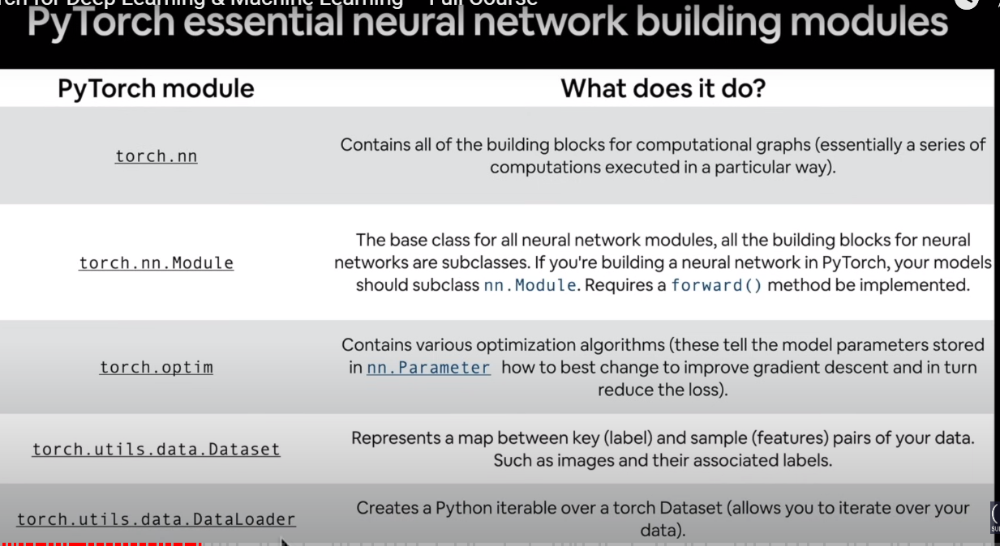

## Checking the contents of our PyTorch model.
Now we've created a model. Let's see what is inside ...
So we can check our model parameters or what's inside our model using .parameters()

In [ ]:
# Create a random seed.

torch.manual_seed(42)

# Create an instance of the model (this is a subclass of nn.Module)

model_0 = LinearRegressionModel()

# Check out the parameters.

list(model_0.parameters())

In [ ]:
# List named parameters.

model_0.state_dict()

In [ ]:
weight, bias

# 7. **Making predictions with our random model using torch.inference_mode()**

Making prediction using 'torch.inference.mode()'

To check our model's predictive power, let's see how well it predicts 'y_test' based on 'X_test'.

When we pass data through our model, it's going to run it through the
'forward()' method.

In [ ]:
# Make predictions with model

with torch.inference_mode():
  y_preds = model_0(X_test)

y_preds

In [ ]:
y_test

In [ ]:
plot_predictions(predictions=y_preds)

# 8. **TRAIN MODEL**

The whole idea of training is for a model to move from some **unknown parameters** (these may be random) to some **known parameters** (In our case weight & bias).

Or in other words, from a poor representation of the data to a better representation of the data.

One way to measure how poor or how wrong your model's predictions are is to use a loss function.

* **NOTE:** LOSS FUNCTION may also be called COST FUNCTION or CRITERION in different areas. For our case, we will call it as LOSS FUNCTION.

Things we need to train:

* **LOSS FUNCTION:** A function to measure how wrong your model's predictions are to the ideal outputs, lower is better.

* **OPTIMIZER:** Takes into account the loss of a model and adjusts the model's parameter (e.g: weight & bias in our case) **TO IMPROVE THE LOSS FUNCTION**.

And specifically for PyTorch, we need:

* A training loop.
* A testing loop.

In [ ]:
list(model_0.parameters())

In [ ]:
model_0.state_dict()

# 9. **Setting up a LOSS FUNCTION and OPTIMIZER with PyTorch**

Inside the optimizer you'll often have to **SET 2 PARAMETERS:**

* params - the model parameters you'd like to optimize, for example
params=model_0.parameters() # model_0 = weight & bias

* lr (learning rate) - the learning rate is a hyperparameter that defines how big/small the optimizer changes the parameters with each step.

E.g: **So learning rate (lr) is 0.0001 and our weight's tensor is 0.3367. lr 0.0001 will change 7 from 0.3367.
The smaller is the learning rate, the smaller is the change in a parameter and vice versa.**

**Hyperparameter is a value that as we data scientist or a ML sets**


**LOSS FUNCTION & OPTIMIZER** they work in TANDOM

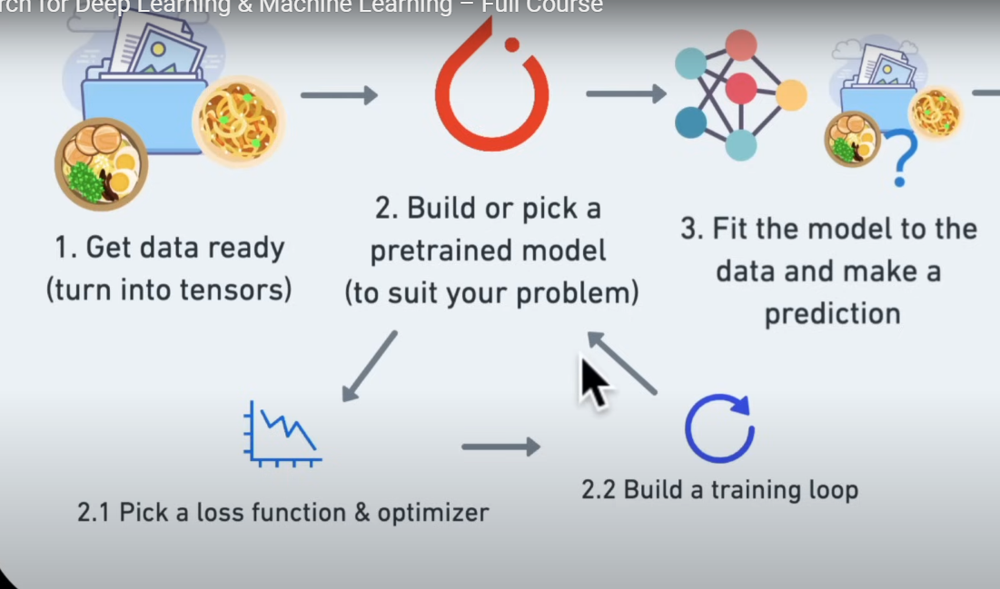

In [ ]:
# Check out our model's parameters (a parameter is a value that the model sets itself)

model_0.state_dict()

# So learning rate (lr) is 0.0001 and our weight's tensor is 0.3367. lr 0.0001 will change 7 from 0.3367.
# The smaller is the learning rate, the smaller is the change in a parameter and vice versa.

In [ ]:
# Set up a LOSS FUNCTION

loss_fn = nn.L1Loss()

# Set up an OPTIMIZER. SGD - stochastic gradient descent

optimizer = torch.optim.SGD(params=model_0.parameters(),
                            lr=0.01) # lr = learning rate = the most important hyperparameter you can set.

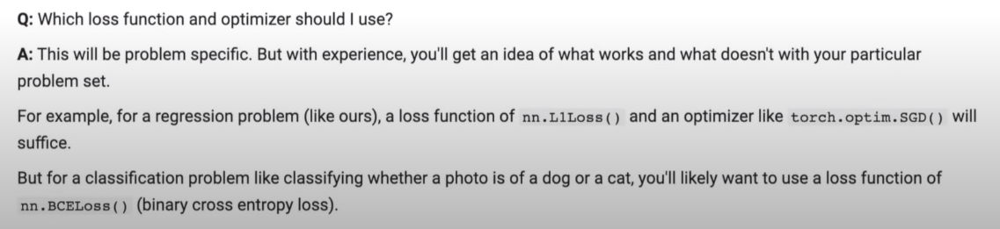

# 10. **PyTorch TRAINING LOOP steps and INTUITION**

*Building a Training Loop and a Testing Loop in PyTorch*

A couple of things we need in **a training loop:**

* 0. **Loop through the data** and do within the loop...
* 1. **Forward pass** (this involves data moving through our model's 'forward()'
functions) to make predictions on data - also called **FORWARD PROPAGATION**
* 2. **Calculate the loss** (compare forward pass predictions to ground truth labels)
* 3. **Optimizer zero grad**
* 4. **Loss backward** - move backwards through the network to calculate the gradient of each of the parameters of our model with respect to the loss (**BACKPROPAGATION**)
* 5. **Optimizer step** - use the optimizer to adjust our model's parameters to try and improve the loss (**GRADIENT DESCENT**)

In [ ]:
# with torch.inference_mode(): # inference_mode = no_grad()

In [ ]:
list(model_0.parameters())

**LEARN BY HEART THE STEPS FOR THE LOOP**

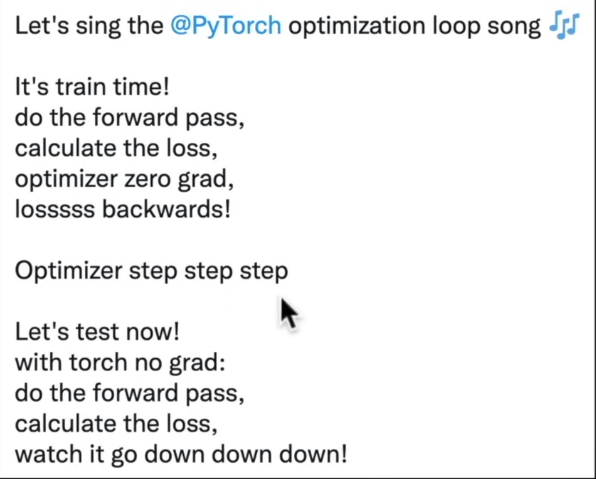

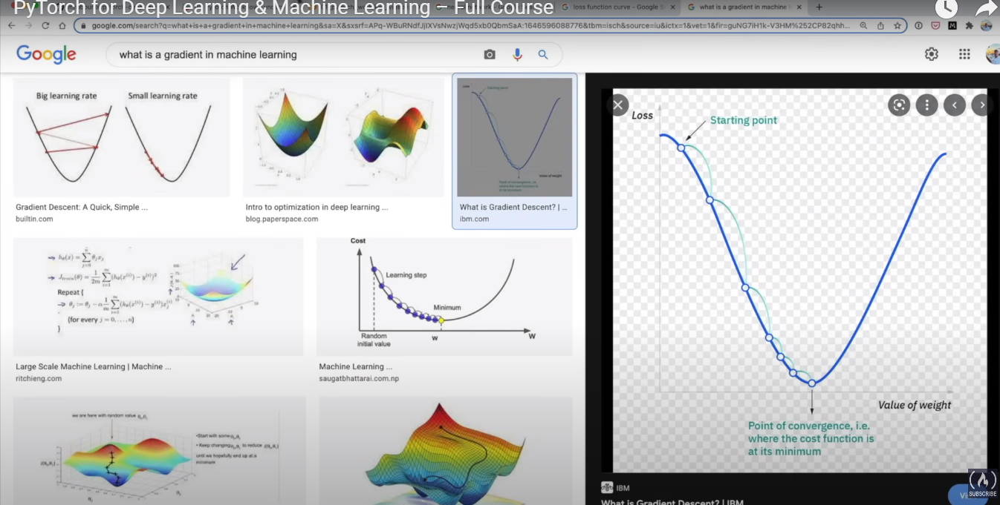

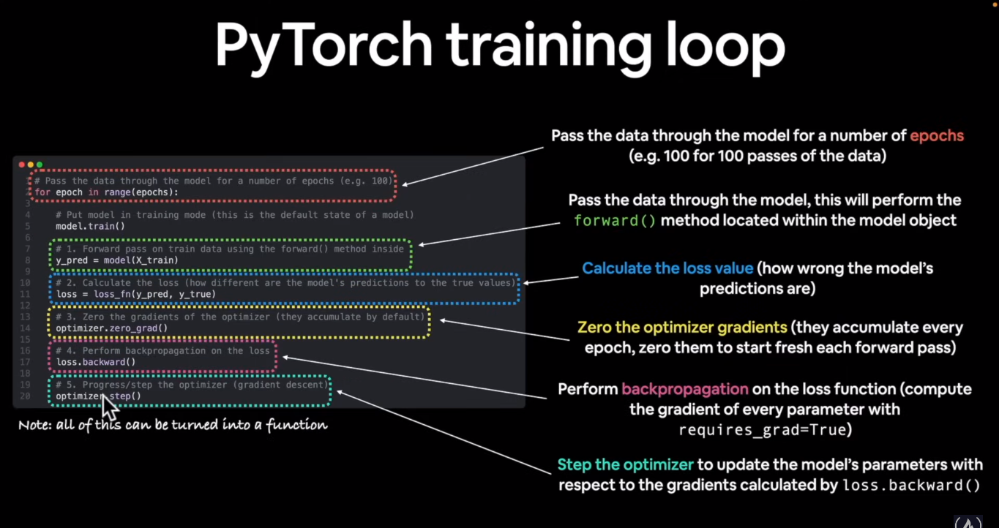

**TRAIN DATA VS TARGET DATA**

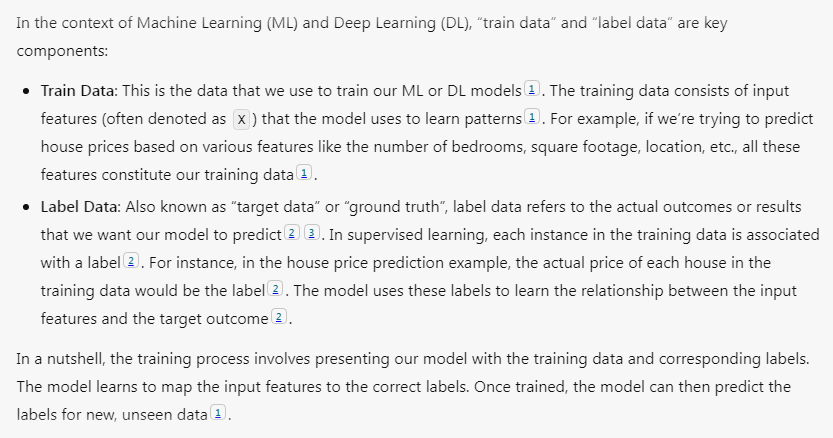

**1. MODELS LEARN PATTERNS ON TRAINING DATA**

**2. IT EVALUATES THOSE PATTERNS THAT'S LEARNED, THE DIFFERENT PARAMETERS ON THE TESTING DATA**

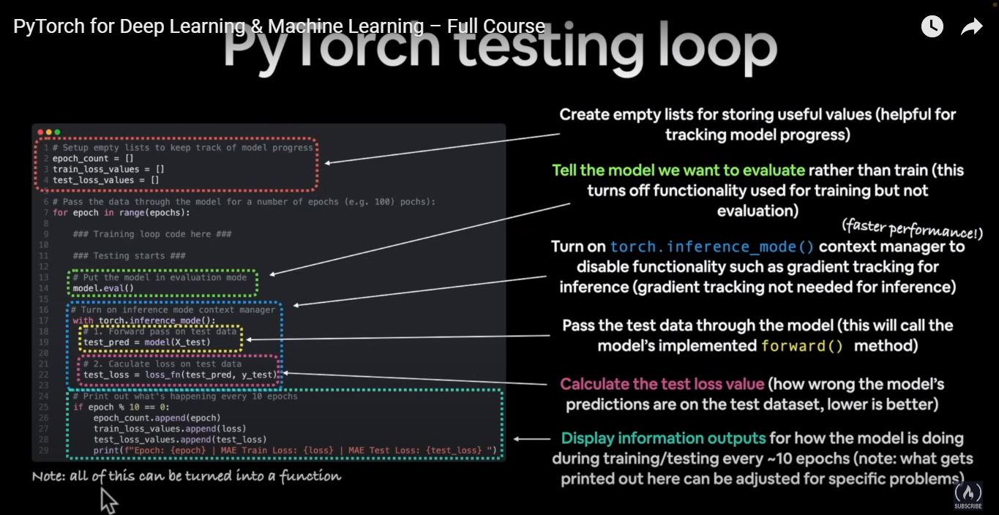

In [ ]:
torch.manual_seed(42)

# An EPOCH is 1 loop through the data ... (This is a hyperparameter because we've set it ourselves)

epochs = 200

# Track different values
epoch_count = []
loss_values = []
test_loss_values = []

### TRAINING
# 0. Loop through the data

for epoch in range(epochs):
  # Set the model to training mode. PyTorch models have a couple of different modes. model_0.train() is a default one.
  model_0.train() # Train mode in PyTorch sets all parameters that require gradients to require gradients

  # 1. Forward pass
  y_pred = model_0(X_train)

  # 2. Calculate the loss.
  loss = loss_fn(y_pred, y_train) # We're calculating the model's predictions on the X_train DATASET and ideal training VALUES.
  # loss(input (first), target(last)) in loss function
  # loss = loss_fn(y_pred, y_train) should come after forward pass y_pred = model_0(X_train)

  # 3. Optimizer zero grad
  optimizer.zero_grad()

  # 4. Perform backpropagation on the loss with respect to the parameters of the model.
  loss.backward()

  # 5. Progress/Step the optimizer (perform gradient descent)
  optimizer.step() # optimizer.step() should come after backpropagation loss.backward()
  # By default how the optimizer changes will accumulate through the loop ... we have to zero them above in step 3 for the next iteration of the loop.

  ### TESTING
  model_0.eval()  # And turns off different settings in the model not needed for evaluation/testing (dropout/batch norm layers)

  with torch.inference_mode(): # Turns off gradient tracking. A couple more things behind the scenes.

      # 1. Do the forward pass
      test_pred = model_0(X_test)

      # 2. Calculate the loss
      test_loss = loss_fn(test_pred, y_test) # Test labels

  # Print out what's happening
  if epoch % 10 == 0:
    epoch_count.append(epoch)
    loss_values.append(loss)
    test_loss_values.append(test_loss)
    print(f"Epoch: {epoch} | Loss: {loss.item()} | Test loss: {test_loss.item()}")

# Print out a model state_dict()
print(model_0.state_dict())

**THIS IS HOW GRADIENT DESCENT WORKS**

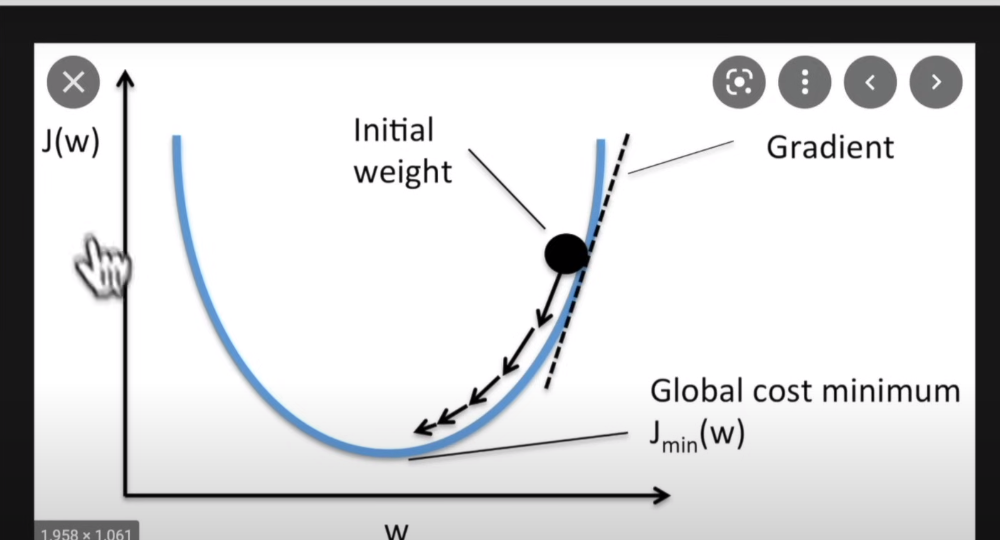

In [ ]:
import numpy as np
np.array(torch.tensor(loss_values).numpy())
np.array(torch.tensor(test_loss_values).numpy())

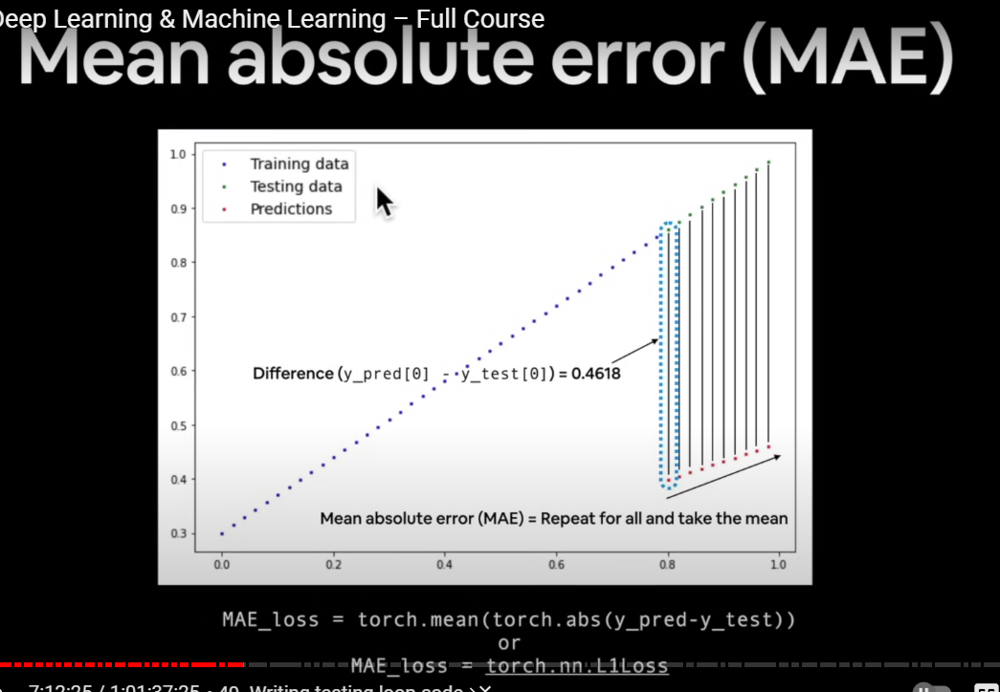

In [ ]:
# Plot the loss curves

plt.plot(epoch_count, np.array(torch.tensor(loss_values).numpy()), label="Train loss")
plt.plot(epoch_count, test_loss_values, label="Test loss")
plt.title("Training and test loss curves")
plt.ylabel("Loss")
plt.xlabel("Epochs")
plt.legend();

In [ ]:
with torch.inference_mode():
  y_preds_new = model_0(X_test)

In [ ]:
model_0.state_dict()

In [ ]:
weight, bias

In [ ]:
plot_predictions(predictions=y_preds);

In [ ]:
plot_predictions(predictions=y_preds_new);

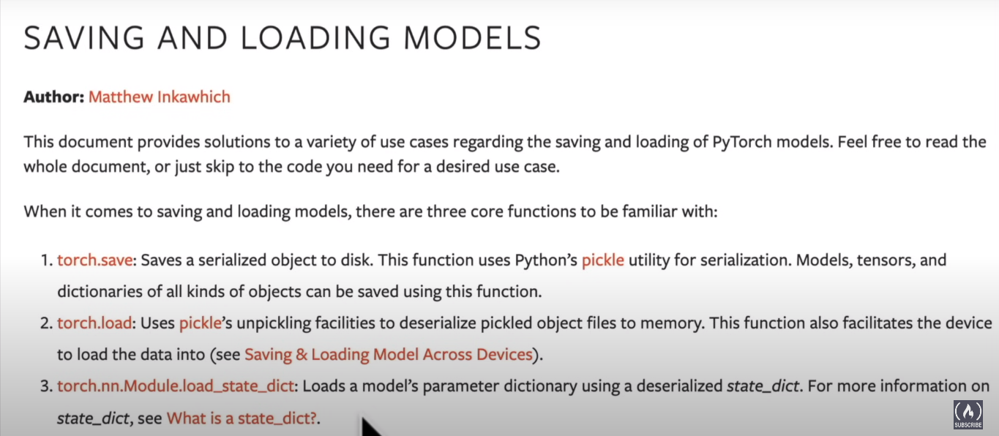

# 11. **Saving a model in PyTorch**

There are 3 main methods you should know about for saving and loading model in PyTorch.

1. 'torch.save()' - allows you to save a PyTorch object in Python's pickle format.
2. 'torch.load()' - allows you to load a saved PyTorch object.
3. 'torch.nn.Module.load_state_dict()' - this allows you to load a model's saved state dictionary.

In [ ]:
# Saving our PyTorch model
from pathlib import Path

# 1. Create model's directory
MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents=True, exist_ok=True)

# 2. Create model save path
MODEL_NAME = '01_pytorch_workflow_model_0.pth'
MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

# 3. Save the model state dict
print(f"Save model to: {MODEL_SAVE_PATH}")
torch.save(obj=model_0.state_dict(),
           f=MODEL_SAVE_PATH)


In [ ]:
!ls -l models

## **Loading a PyTorch model**

Since we saved our model's state_dict() rather the entire model, we'll create a new instance of our model class and load the saved state_dict() into that.

In [ ]:
model_0.state_dict()

In [ ]:
# To load in a saved state_dict, we have to instantiate a new instance of our model class.
loaded_model_0 = LinearRegressionModel()

# Load the saved state_dict of model_0 (this will update the new instance with updated parameters)
loaded_model_0.load_state_dict(torch.load(f=MODEL_SAVE_PATH))

In [ ]:
loaded_model_0.state_dict()

## **COMPARING LOADED MODELS**

In [ ]:
# Make some predictions with our loaded model
loaded_model_0.eval()
with torch.inference_mode():
  loaded_model_preds = loaded_model_0(X_test)

loaded_model_preds

In [ ]:
# Make some model preds
model_0.eval()
with torch.inference_mode():
  y_preds = model_0(X_test)
y_preds

In [ ]:
# Compare loaded model preds with original model preds.
y_preds == loaded_model_preds

# 12. **Putting it all together**

Let's go back through the steps above and see it all in one place.

Create device-agnostic code.

This means if we've got access to a GPU, our code will use it (For potentially faster computing)

If no GPU is available, the code will default to using CPU.

In [ ]:
# Import PyTorch and matplotlib
import torch
from torch import nn
import matplotlib.pyplot as plt

# Check PyTorch version
torch.__version__

In [ ]:
# Setup device agnostic code
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

## **12.1 DATA**

In [ ]:
# Create some data using linear regression formula of y = weight * X + bias
weight = 0.7
bias = 0.3

# Create range values
start = 0
end = 1
step = 0.02

# Create X and y (features and labels)
X = torch.arange(start, end, step).unsqueeze(dim=1) # Without unsqueeze, errors will pop up.
y = weight * X + bias

X[:10], y[:10]

In [ ]:
# Split data
train_split = int(0.8 * len(X))
X_train, y_train = X[:train_split], y[:train_split]
X_test, y_test = X[train_split:], y[train_split:]
len(X_train), len(y_train), len(X_test), len(y_test)

In [ ]:
import matplotlib.pyplot as plt

def plot_predictions(train_data=X_train,
                     train_labels=y_train,
                     test_data=X_test,
                     test_labels=y_test,
                     predictions=None):
  """
  Plots training data, test data and compares predictions.
  """
  plt.figure(figsize=(10, 7))

  # Plot training data in blue

  plt.scatter(train_data, train_labels, c='b', s=4, label= "Training data")

  # Plot test data in green

  plt.scatter(test_data, test_labels, c='g', s=4, label= "Testing data")

  # Are there predictions?
  if predictions is not None:

    # Plot the predictions if they exist
    plt.scatter(test_data, predictions, c='r', s=4, label= "Predictions")

    # Show the legend
    plt.legend(prop={'size': 14});

In [ ]:
# Plot the data
# Note: if you don't have the plot_predictions() function loaded, this will error.
plot_predictions(X_train, y_train, X_test, y_test)

## **12.2 Building a PyTorch linear model**

In [ ]:
# Create a linear model by subclassing nn.Module
class LinearRegressionModelV2(nn.Module):
  def __init__(self):
    super().__init__()
    # Use nn.Linear() for creating the model parameters
    # Also called: linear transform, dense layer, probing layer, fully connected layer
    self.linear_layer = nn.Linear(in_features=1,
                                  out_features=1)

  def forward(self, x: torch.Tensor) -> torch.Tensor:
    return self.linear_layer(x)

# Set the manual seed
torch.manual_seed(42)
model_1 = LinearRegressionModelV2()
model_1, model_1.state_dict()

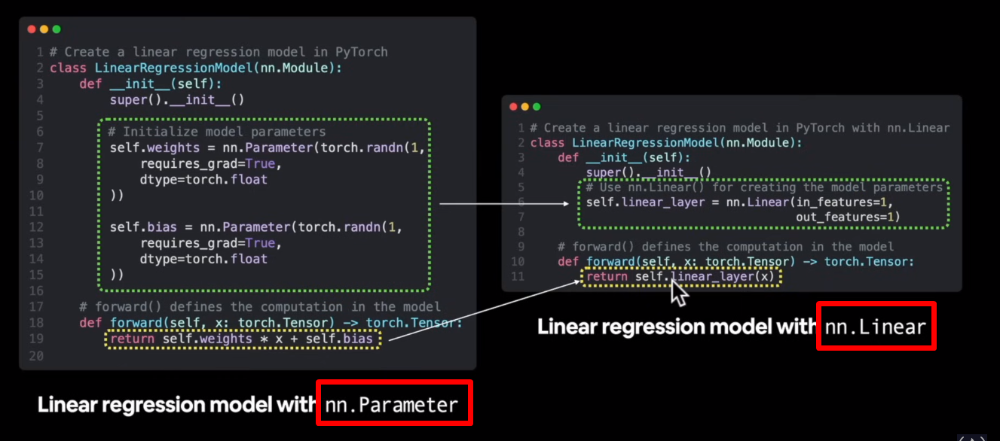

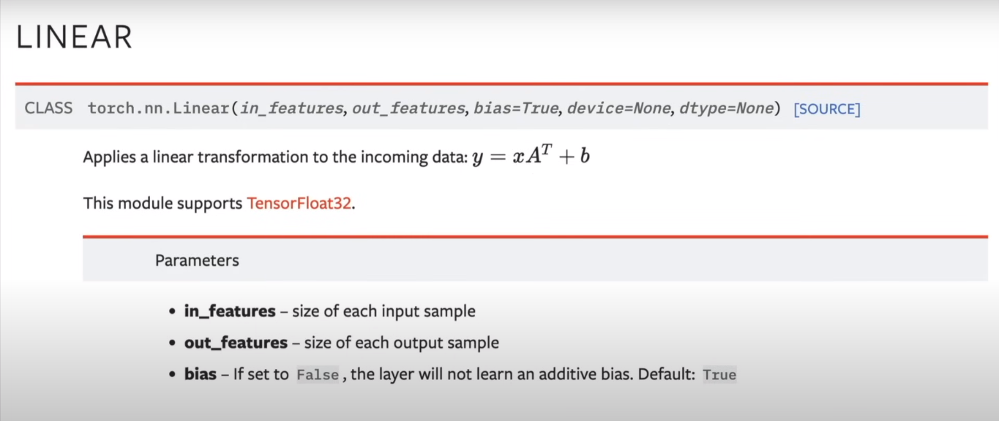

In [ ]:
# Check the model current device
next(model_1.parameters()).device

In [ ]:
# Set the model to use the target device
model_1.to(device)
next(model_1.parameters()).device

## **12.3 Training the model**

* Loss function
* Optimizer
* Training loop
* Testing loop

In [ ]:
# Setup loss function
loss_fn = nn.L1Loss() # the same as MAE - Mean Absolute Error.
# The magnitude of difference between the prediction of an observation and the true value of that observation.

# Setup our optimizer
optimizer = torch.optim.SGD(params=model_1.parameters(),
                            lr=0.01)

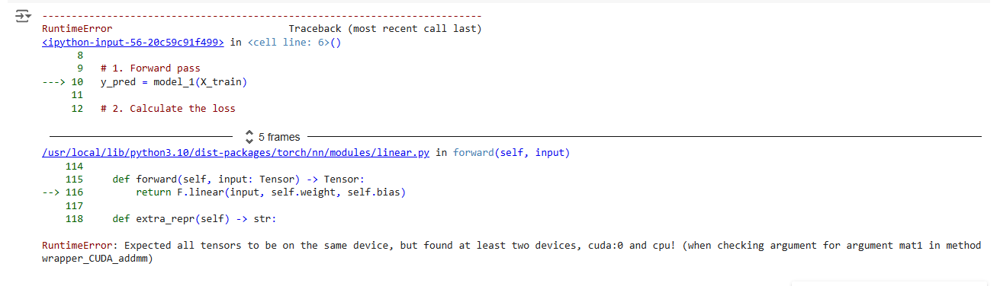

In [ ]:
# Let's write a training loop.
torch.manual_seed(42)

epochs = 200

# Put data on the target device (device agnostic code for data)
X_train = X_train.to(device)
y_train = y_train.to(device)
X_test = X_test.to(device)
y_test = y_test.to(device)

for epoch in range(epochs):
  model_1.train()

  # 1. Forward pass
  y_pred = model_1(X_train)

  # 2. Calculate the loss
  loss = loss_fn(y_pred, y_train)

  # 3. Optimizer zero grad
  optimizer.zero_grad()

  # 4. Perform backpropagation
  loss.backward()

  # 5. Optimizer step
  optimizer.step()

  ### TESTING
  model_1.eval()
  with torch.inference_mode():
    test_pred = model_1(X_test)

    test_loss = loss_fn(test_pred, y_test)

  # Print out what's happening

  if epoch % 10 == 0:
    print(f"Epoch: {epoch} | Loss: {loss} | Test loss: {test_loss}")

In [ ]:
model_1.state_dict()

In [ ]:
weight, bias

## **12.4 Making predictions with a trained model**

In [ ]:
# Turn the model into evaluation mode
model_1.eval()

# We TRAIN our model on the TRAIN DATA.
# We EVALUATE our model on the TEST DATA.

# Make predictions on the test data.
with torch.inference_mode():
  y_preds = model_1(X_test)
y_preds



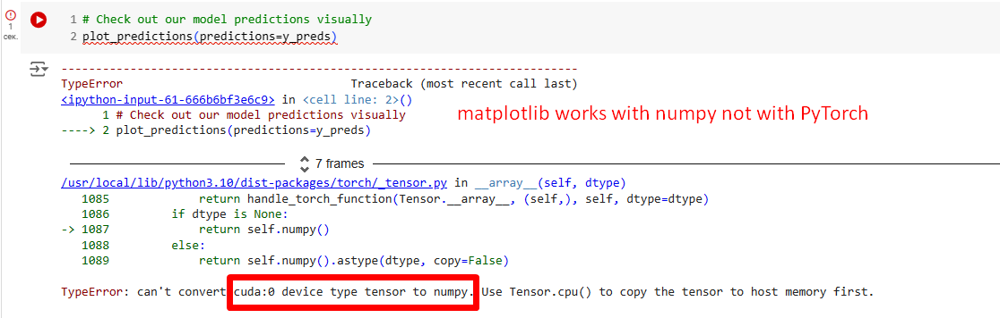

In [ ]:
# Check out our model predictions visually
plot_predictions(predictions=y_preds.cpu())

## **12.5 Saving and Loading a trained model**

In [ ]:
from pathlib import Path

# 1. Create models directory
MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents=True, exist_ok=True) # mkdir() = make directory

# 2. Create save model path
MODEL_NAME = "01_pytorch_workflow_model_1.pth" # you can use pt or pth
MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

# Save the model state_dict()
print(f"Saving model to: {MODEL_SAVE_PATH}")
torch.save(obj=model_1.state_dict(),
           f=MODEL_SAVE_PATH) # This is gonna contain our trained model parameters.

In [ ]:
model_1.state_dict()

In [ ]:
# Load a PyTorch model

# Create a new instance of linear regression model V2
loaded_model_1 = LinearRegressionModelV2()

# Load the saved model_1 state_dict
loaded_model_1.load_state_dict(torch.load(MODEL_SAVE_PATH))

# Put the loaded model to device
loaded_model_1.to(device)

In [ ]:
next(loaded_model_1.parameters()).device

In [ ]:
loaded_model_1.state_dict()

In [ ]:
# Evaluate the loaded model
loaded_model_1.eval()
with torch.inference_mode():
  loaded_model_1_preds = loaded_model_1(X_test)
y_preds == loaded_model_1_preds

####**CLASSIFICATION is predicting a THING. REGRESSION is predicting a NUMBER**

# **CHAPTER 2. NEURAL NETWORK CLASSIFICATION**

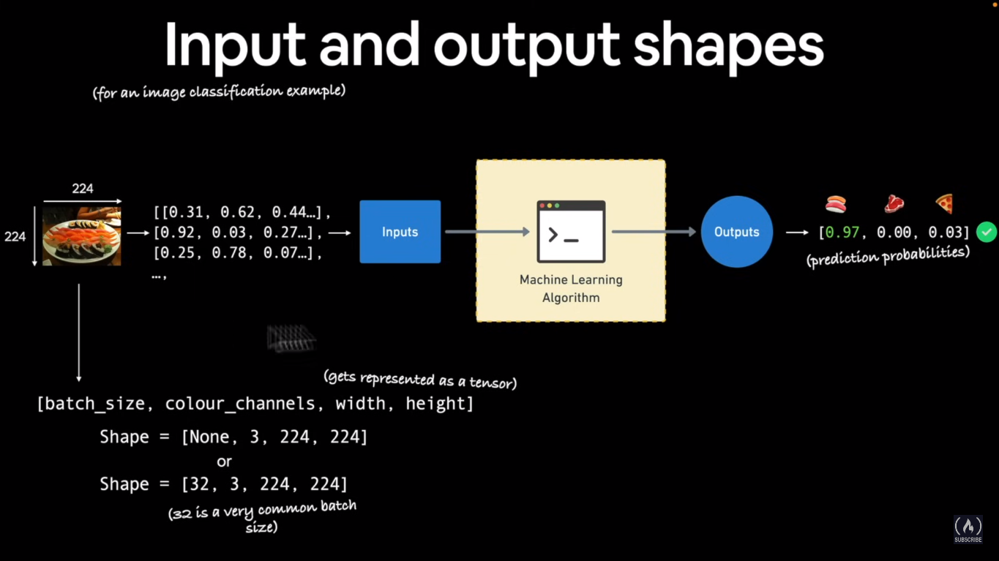

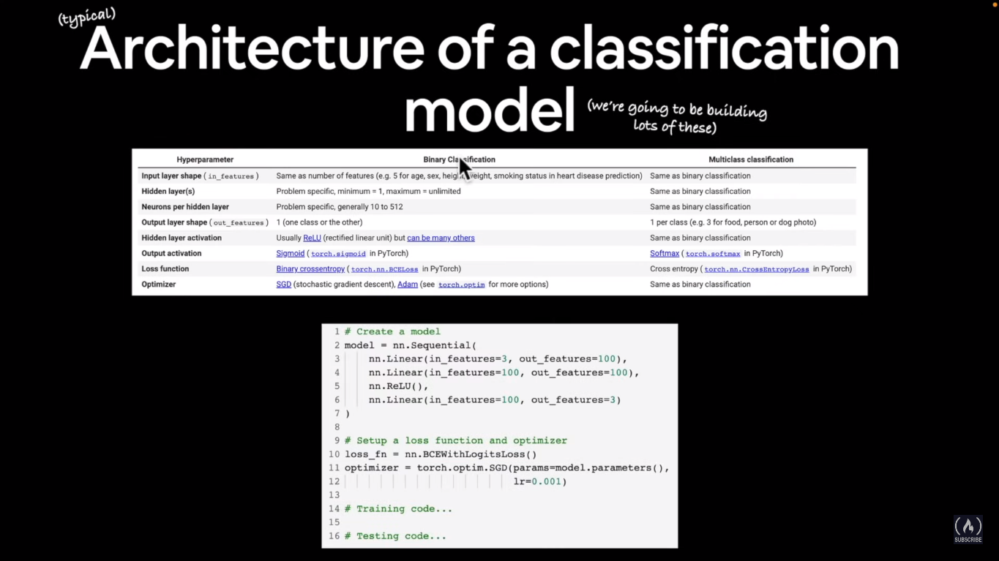